<a href="https://colab.research.google.com/github/RodriGuerra98/TFG21RG/blob/main/visualization_covid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports y variables globales

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

import plotly.express as px
from sklearn.preprocessing import OrdinalEncoder
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from google.colab import drive


In [2]:
drive.mount('/content/drive')
%cd /content/drive/My\ Drive/

Mounted at /content/drive
/content/drive/My Drive


In [3]:
#%cd /content/drive/MyDrive/Pesq/Tfg/Tfg21RG
%cd /content/drive/MyDrive/Pesq/Tfg/

[Errno 2] No such file or directory: '/content/drive/MyDrive/Pesq/Tfg/'
/content/drive/My Drive


##### Datasets

In [119]:
DATA_PATH_COVID = "Tfg21RG/Data/Covid/"
DATA_PATH_TURISM = "Tfg21RG/Data/Turism/"
DATA_PATH_SPAIN = "Tfg21RG/Data/Spain/"

# defunciones
DATA_PATH_SPAIN_DEFUNCIONES_1900_2020 = DATA_PATH_SPAIN + "defunciones_1900_2020.csv"
DATA_PATH_SPAIN_DEFUNCIONES_1941_1974 = DATA_PATH_SPAIN + "defunciones_mensuales_1941_1974.csv" # total, ccaa, año/mes, deaths
DATA_PATH_SPAIN_DEFUNCIONES_1975_2019 = DATA_PATH_SPAIN + "defunciones_mensuales_1975_2019.csv" # total, ccaa, año/mes, deaths
DATA_PATH_SPAIN_DEFUNCIONES_2019_2021 = DATA_PATH_SPAIN + "muertes_semanales_2019_2021.csv"
DATA_PATH_MOMO = "https://momo.isciii.es/public/momo/data"

# mortalidad y causas
DATA_PATH_SPAIN_TASA_1900_2020          = DATA_PATH_SPAIN + "tasa_de_muertes_1900_2020.csv"
DATA_PATH_SPAIN_DEFUNCIONES_2019vs2020  = DATA_PATH_SPAIN + "ccaa_muertes_2019vs2020.csv"
DATA_PATH_SPAIN_TASA_2019vs2020         = DATA_PATH_SPAIN + "ccaa_tasa_2019vs2020.csv"

# covid
DATA_PATH_SPAIN_DEFUNCIONES_COVID   = DATA_PATH_SPAIN + "defunciones_covid_2020.csv"
# https://cnecovid.isciii.es/covid19/#documentaci%C3%B3n-y-datos
DATA_PATH_SPAIN_CASOS_COVID         = "https://cnecovid.isciii.es/covid19/resources/casos_tecnica_ccaa.csv"
DATA_PATH_SPAIN_VACUNAS             = "https://raw.githubusercontent.com/civio/covid-vaccination-spain/main/data.csv"
DATA_PATH_SPAIN_UCI                 = "https://cnecovid.isciii.es/covid19/resources/casos_hosp_uci_def_sexo_edad_provres.csv"

# Nacimientos
DATA_PATH_SPAIN_NACIMIENTOS_1941_1974 = DATA_PATH_SPAIN + "nacimientos_1941_1974.csv"
DATA_PATH_SPAIN_NACIMIENTOS_1975_2019 = DATA_PATH_SPAIN + "nacimientos_1975_2019.csv"
DATA_PATH_SPAIN_NACIMIENTOS           = DATA_PATH_SPAIN + "nacimientos_2020.csv"

# Poblacion
DATA_PATH_SPAIN_POBLACION     = DATA_PATH_SPAIN + "poblacion.csv"
# https://www.ine.es/jaxiT3/Datos.htm?t=2074
DATA_PATH_SPAIN_VIAJEROS      = DATA_PATH_SPAIN + "viajeros_ccaa.csv"
DATA_PATH_SPAIN_VIAJEROS_V2   = DATA_PATH_SPAIN + "evolucion_de_la_llegada_d.csv"
DATA_PATH_SPAIN_TURISTAS      = DATA_PATH_TURISM + "INE/Mensual/turismo_españa.csv"

# EUROPE
URL_OWID_COVID                = "https://covid.ourworldindata.org/data/owid-covid-data.csv"
URL_OWID_VACCINATIONS         = "https://covid.ourworldindata.org/data/vaccinations/vaccinations.csv"
URL_ECDC_COVID                = "https://opendata.ecdc.europa.eu/covid19/nationalcasedeath_eueea_daily_ei/csv/data.csv"
URL_ECDC_COVID_CASES          = "https://opendata.ecdc.europa.eu/covid19/casedistribution/csv/data.csv"
URL_ECDC_COVID_RESPONSE       = "https://www.ecdc.europa.eu/sites/default/files/documents/response_graphs_data_2021-04-15.csv"
URL_ECDC_VACCINATIONS         = "https://opendata.ecdc.europa.eu/covid19/vaccine_tracker/csv/data.csv"
DATA_PATH_EUR_NUM_TURISM      = DATA_PATH_TURISM + "OWID/international-tourism-number-of-arrivals.csv"
DATA_PATH_EUR_ARRIVALS_TURISM = DATA_PATH_TURISM + "OWID/international-tourist-arrivals-by-world-region.csv"


# Preprocess

#### Codigos, estandarizacion


In [8]:
standardize = {
    "ccaa" : {
        "Nacional": 0,
        "Total": 0,
        "Total nacional": 0,
        "Andalucía": 1,
        "AN": 1,
        "Aragón": 2,
        "AR": 2,
        "Asturias": 3,
        "AS": 3,
        "Balear":	4,
        "IB": 4,
        "Canarias":	5,
        "CN": 5,
        "Cantabria":	6,
        "CB": 6,
        "León":	7,
        "Leon":	7,
        "CL": 7,
        "Mancha":	8,
        "CM": 8,
        "Cataluña":	9,
        "CT": 9,
        "Valenciana":	10,
        "VC": 10,
        "Extremadura":	11,
        "EX": 11,
        "Galicia":	12,
        "GA": 12,
        "Madrid":	13,
        "MD": 13,
        "Murcia":	14,
        "MC": 14,
        "Nav":	15,
        "NC": 15,
        "Vasco":	16,
        "PV": 16,
        "Rioja":	17,
        "RI": 17,
        "Ceuta":	18,
        "CE": 18,
        "Melilla":	19,
        "ML": 19,
        "Extranjero": 20,
        "Fuerzas Armadas": 21
    },
    "gender": {
        "Hombre": 2,
        "Hombres": 2,
        "hombres": 2,
        "Varones": 2,
        "Mujer": 1,
        "Mujeres": 1,
        "mujeres": 1,
        "Total": 0,
        "all": 0,
        "Todos": 0,
        "todos": 0,
        "Ambos sexos": 0
    },
    "age": {
        "all": 22, 
        "menos_65": 1, # 1-14
        "65_74": 14, # o 15 
        "mas_74": 16, # o 17 - 21
        "0 años": 0,
        "De 1 a 4 años": 1, 
        "De 5 a 9 años": 2, 
        'De 10 a 14 años': 3,
        'De 15 a 19 años': 4, 
        'De 20 a 24 años': 5, 
        'De 25 a 29 años': 6,
        'De 30 a 34 años': 7, 
        'De 35 a 39 años': 8, 
        'De 40 a 44 años': 9,
        'De 45 a 49 años': 10, 
        'De 50 a 54 años': 11, 
        'De 55 a 59 años': 12,
        'De 60 a 64 años': 13, 
        'De 65 a 69 años': 14, 
        'De 70 a 74 años': 15,
        'De 75 a 79 años': 16, 
        'De 80 a 84 años': 17, 
        'De 85 a 89 años': 18,
        '90 y más años': 19, 
        'De 90 a 94 años': 20, 
        '95 y más años': 21
    },
    "functions": {
       'Tasa de mortalidad': 0,
       'Promedio de años vividos el último año de vida': 1,
       'Riesgo de muerte': 2, 
       'Supervivientes': 3, 
       'Defunciones teóricas': 4,
       'Población estacionaria': 5, 
       'Tiempo por vivir': 6, 
       'Esperanza de vida': 7 
    }, 
    "month": {
        "Total": 0,
        "Enero": 1,
        "Febrero": 2,
        "Marzo": 3,
        "Abril": 4,
        "Mayo": 5,
        "Junio": 6,
        "Julio": 7,
        "Agosto": 8,
        "Septiembre": 9,
        "Octubre": 10,
        "Noviembre": 11,
        "Diciembre": 12
    },
    "covid": {
      'Total': 0,
      'Covid-19 Virus identificado': 1,
      'Covid-19 Virus no identificado (sospechoso)': 2, 
      'Covid-19 virus no identificado (sospechoso)(comorbilidad)': 2,	
      'Otras causas': 3,
      'Total Defunciones con covid-19 (comorbilidad)': 4,
      'Covid-19 Virus identificado (comorbilidad)': 1
    },
    "place": {
      'Total': 0, 
      'Centro hospitalario': 1, 
      'Domicilio particular': 2,
      'Residencia socio-sanitaria' : 3, 
      'Otro Lugar': 4, 
      'No consta': 5
    }

    
}


#### Funciones

In [9]:
def dateFormatter(df, dateColumnName):
  df[dateColumnName] = pd.to_datetime(df[dateColumnName], errors='coerce')
  df['year']= df[dateColumnName].dt.year
  df['month']= df[dateColumnName].dt.month
  df['day']= df[dateColumnName].dt.day
  return df;

In [10]:
def splitYearWeek(df, columnName):
  df[["year", "week"]] = df[columnName].str.split("SM", expand=True);
  return df;

In [11]:
def splitYearMonth(df, columnName):
  df[["year", "month"]] = df[columnName].str.split("M", expand=True);
  return df;

In [12]:
def numerizacionDeAtributos(dataset, reglas, atributo, doesContains):
  # dataset[atributo + "_original"] = dataset[atributo]
        
  try:
    if doesContains:
      for regla in reglas:
        dataset.loc[dataset[atributo].str.contains(regla, case=True, na=False), atributo] = reglas[regla]
    else:
      dataset[atributo] = dataset[atributo].map(reglas)
  except:
    pass
  return dataset


In [13]:
def extraerEnteros(dataset, atributo):
  dataset[atributo] = pd.to_numeric(dataset[atributo].str.extract(r'(\d+)', expand=False))
  return dataset;


In [14]:
def hotEncoding(df, columnName):
  ord_enc = OrdinalEncoder()
  df = df.dropna(subset=[columnName])
  df[columnName + "_code"] = ord_enc.fit_transform(df[[columnName]])
  return df;

In [15]:
def preprocess():
  createDataset();
  normalizar();
  preprocesar();
  train_test_split(data, test_size=porcentaje_test,random_state=seed)

In [16]:
def normalizar(columns):
  for column in columns:
    dataset[column] = dataset[column] /dataset[column].abs().max()    

In [17]:
def removeRowsContainingUnnecessaryData(df, columnName,unwantedString):
  return df[~df[columnName].isin([unwantedString])] 
  

In [18]:
def calcularMedia(df, atributo):
  df = df.groupby(["year", atributo], as_index=False)
  df = df.sample()
  return df[["year", atributo]].describe()

In [19]:
def calcularOperacionesBasicas(df, atributo, doSum):
  if doSum == False:
    return calcularMedia(df, atributo)
  else:
    df = df.groupby(["year"], as_index=False).agg({atributo: "sum"})
    df = df.sample()
    return df[["year", atributo]].describe()

In [20]:
def percentageToNumeric(x):
  x = x.replace(",", ".")
  return x.strip('%')

In [21]:
df_vaccinations_ecdc = pd.read_csv(URL_ECDC_VACCINATIONS)
df_vaccinations_ecdc.sort_values('YearWeekISO')

,YearWeekISO,FirstDose,FirstDoseRefused,SecondDose,UnknownDose,NumberDosesReceived,Region,Population,ReportingCountry,TargetGroup,Vaccine,Denominator
19058,2020-W52,18,0,0,0,nan,PL41,37958138,PL,Age50_59,COM,"408,573"
19006,2020-W52,0,0,0,0,nan,PL71,37958138,PL,Age25_49,MOD,"877,201"
19005,2020-W52,0,0,0,0,nan,PL,37958138,PL,Age25_49,MOD,"14,035,724"
19004,2020-W52,0,0,0,0,nan,PL63,37958138,PL,Age25_49,MOD,"863,608"
19003,2020-W52,0,0,0,0,nan,PL,37958138,PL,Age25_49,JANSS,"14,035,724"
...,...,...,...,...,...,...,...,...,...,...,...,...
31541,2021-W19,3,0,2,0,nan,PL41,37958138,PL,AgeUNK,AZ,nan
31542,2021-W19,47,0,10,0,nan,PL41,37958138,PL,AgeUNK,COM,nan
31543,2021-W19,2,0,0,0,nan,PL41,37958138,PL,AgeUNK,JANSS,nan
31533,2021-W19,992,0,5277,0,nan,PL92X,37958138,PL,Age80+,COM,nan


# España

In [ ]:
## Spain
# df_covid_momo
# df_mortality_spain
# df_deaths_spain
# df_births_spain
# df_population_spain
# df_deaths_covid_spain
# df_mortality_covid_spain
# df_cause_covid_spain
# df_deaths_2016_2020_spain
# df_deaths_cause_spain
# df_ncasos_covid
# df_viajeros_ccaa

# ## ECDC
# df_vaccinations_online
# df_covid_ecdc
# df_covid_ecdc_cases
# df_covid_ecdc_response
# df_vaccinations_ecdc

#### Defunciones

##### Defunciones anuales solo en España desde 1900 - 2020

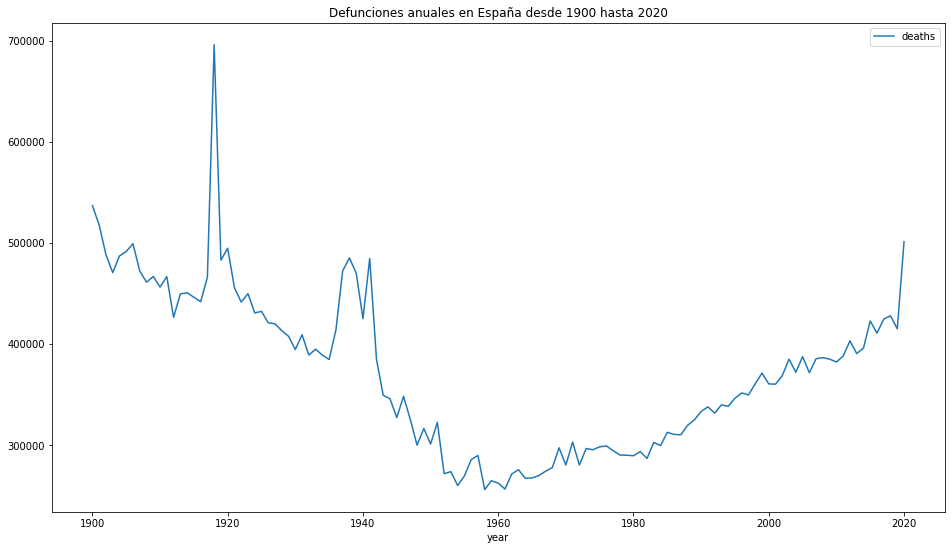

,year,deaths,ccaa
0,1900,536716,0
1,1901,517575,0
2,1902,488289,0
3,1903,470387,0
4,1904,486889,0
5,1905,491369,0
6,1906,499018,0
7,1907,472007,0
8,1908,460946,0
9,1909,466648,0


In [50]:
df_defunciones_spain_1900_2020 = pd.read_csv(DATA_PATH_SPAIN_DEFUNCIONES_1900_2020, sep=";", thousands=".")
# # ## Graphic of deaths of covid in spain
df_defunciones_spain_1900_2020 = df_defunciones_spain_1900_2020.rename(columns={"Año": "year", "Defunciones (los datos de 2020 son provisionales)": "deaths"})
df_defunciones_spain_1900_2020 = df_defunciones_spain_1900_2020[["year", "deaths"]]
df_defunciones_spain_1900_2020["ccaa"] = 0
df_defunciones_spain_1900_2020.plot(x="year", y="deaths", figsize=(16,9), title="Defunciones anuales en España desde 1900 hasta 2020")
plt.show()
df_defunciones_spain_1900_1940 = df_defunciones_spain_1900_2020[(df_defunciones_spain_1900_2020["year"] >= 1900) & (df_defunciones_spain_1900_2020["year"] < 1941)]
df_defunciones_spain_1900_1940

##### Defunciones mensuales 1941 - 1974

In [58]:
df_defunciones_spain_1941_1974 = pd.read_csv(DATA_PATH_SPAIN_DEFUNCIONES_1941_1974, sep=";", decimal=',', thousands='.', encoding='latin-1')
df_defunciones_spain_1941_1974 = df_defunciones_spain_1941_1974.rename(columns={"Comunidades y Ciudades Autónomas": "ccaa", "Periodo": "time", "Total": "deaths"})
df_defunciones_spain_1941_1974["ccaa"] = df_defunciones_spain_1941_1974["ccaa"].replace("Total", "0 Total")
df_defunciones_spain_1941_1974["ccaa"] = df_defunciones_spain_1941_1974["ccaa"].replace("Extranjero", "20 Extranjero")
df_defunciones_spain_1941_1974 = extraerEnteros(df_defunciones_spain_1941_1974, "ccaa") 
df_defunciones_spain_1941_1974['ccaa'] = df_defunciones_spain_1941_1974['ccaa'].fillna(0)
df_defunciones_spain_1941_1974 = df_defunciones_spain_1941_1974[["time", "ccaa", "deaths"]]
df_defunciones_spain_1941_1974 = df_defunciones_spain_1941_1974.sort_values(by="time")

# ## Graphic of deaths of covid in spain 
fig = px.line(df_defunciones_spain_1941_1974, x="time", y="deaths", color="ccaa",
              line_group="ccaa", title="Defunciones anuales en España por región desde 1991 hasta 2018 (las ccaa desde 2006)")
fig.show()

df_defunciones_spain_1941_1974 = splitYearMonth(df_defunciones_spain_1941_1974, "time")


df_defunciones_spain_1941_1974[df_defunciones_spain_1941_1974["ccaa"] == 8]

,time,ccaa,deaths,year,month
3671,1941M01,8,4420,1941,01
3670,1941M02,8,3532,1941,02
3669,1941M03,8,3725,1941,03
3668,1941M04,8,3745,1941,04
3667,1941M05,8,3371,1941,05
...,...,...,...,...,...
3268,1974M08,8,1215,1974,08
3267,1974M09,8,1036,1974,09
3266,1974M10,8,1232,1974,10
3265,1974M11,8,1344,1974,11


##### Defunciones mensuales 1975 - 2019

In [ ]:
df_defunciones_spain_1975_2019 = pd.read_csv(DATA_PATH_SPAIN_DEFUNCIONES_1975_2019, sep=";", decimal=',', thousands='.', encoding='latin-1')
df_defunciones_spain_1975_2019 = df_defunciones_spain_1975_2019.rename(columns={"Comunidades y Ciudades Autónomas": "ccaa", "Periodo": "time", "Total": "deaths"})
df_defunciones_spain_1975_2019["ccaa"] = df_defunciones_spain_1975_2019["ccaa"].replace("Total", "0 Total")
df_defunciones_spain_1975_2019["ccaa"] = df_defunciones_spain_1975_2019["ccaa"].replace("Extranjero", "20 Extranjero")
df_defunciones_spain_1975_2019 = extraerEnteros(df_defunciones_spain_1975_2019, "ccaa") 
df_defunciones_spain_1975_2019 = df_defunciones_spain_1975_2019[["time", "ccaa", "deaths"]]
df_defunciones_spain_1975_2019 = df_defunciones_spain_1975_2019.sort_values(by="time") 

# ## Graphic of deaths of covid in spain 
fig = px.line(df_defunciones_spain_1975_2019, x="time", y="deaths", color="ccaa",
              line_group="ccaa", title="Defunciones anuales en España por región desde 1991 hasta 2018 (las ccaa desde 2006)")
fig.show()

df_defunciones_spain_1975_2019 = splitYearMonth(df_defunciones_spain_1975_2019, "time")


df_defunciones_spain_1975_2019[df_defunciones_spain_1975_2019["ccaa"] == 8]

,time,ccaa,deaths,year,month
4859,1975M01,8,1968,1975,01
4858,1975M02,8,1304,1975,02
4857,1975M03,8,1384,1975,03
4856,1975M04,8,1225,1975,04
4855,1975M05,8,1240,1975,05
...,...,...,...,...,...
4324,2019M08,8,1456,2019,08
4323,2019M09,8,1346,2019,09
4322,2019M10,8,1477,2019,10
4321,2019M11,8,1564,2019,11


##### Defunciones en españa 2019-2021 (MoMo)


In [69]:
df_defunciones_spain_2019_2021 = pd.read_csv(DATA_PATH_MOMO)
pd.options.display.float_format = '{:,.0f}'.format
# Preprocess
df_defunciones_spain_2019_2021 = df_defunciones_spain_2019_2021.rename(columns={"cod_ine_ambito": "ccaa", "nombre_sexo": "gender", "cod_gedad": "age", "defunciones_observadas": "deaths"})
df_defunciones_spain_2019_2021['ccaa'] = df_defunciones_spain_2019_2021['ccaa'].fillna(0)

df_defunciones_spain_2019_2021 = numerizacionDeAtributos(df_defunciones_spain_2019_2021, standardize["gender"], "gender", True)
df_defunciones_spain_2019_2021 = numerizacionDeAtributos(df_defunciones_spain_2019_2021, standardize["age"], "age", True)
df_defunciones_spain_2019_2021["deaths"] = df_defunciones_spain_2019_2021["deaths"].astype(float) 

## Graphic of deaths of covid in spain 
df_defunciones_spain_2019_2021graphic = df_defunciones_spain_2019_2021[(df_defunciones_spain_2019_2021["gender"] == 0) & (df_defunciones_spain_2019_2021["age"] == 22)]
fig = px.line(df_defunciones_spain_2019_2021graphic, x="fecha_defuncion", y="deaths", color="ccaa",
              line_group="ccaa", title="Defunciones diarias en España por región desde 2019 a la actualidad")
fig.show()

# # Show data
df_defunciones_spain_2019_2021 = dateFormatter(df_defunciones_spain_2019_2021, "fecha_defuncion")
df_defunciones_spain_2019_2021 = df_defunciones_spain_2019_2021[["ccaa", "gender", "age", "year", "month", "day", "deaths"]]
df_defunciones_spain_2019_2021.head(n=20)

,ccaa,gender,age,year,month,day,deaths
0,0,0,22,2019,4,28,"1,049"
1,0,0,22,2019,4,29,"1,083"
2,0,0,22,2019,4,30,"1,122"
3,0,0,22,2019,5,1,"1,073"
4,0,0,22,2019,5,2,"1,050"
5,0,0,22,2019,5,3,"1,071"
6,0,0,22,2019,5,4,"1,102"
7,0,0,22,2019,5,5,946
8,0,0,22,2019,5,6,"1,008"
9,0,0,22,2019,5,7,"1,128"


##### Defunciones en españa

In [70]:
df_defunciones_spain_total = pd.concat(
    [
     df_defunciones_spain_1900_1940, 
     df_defunciones_spain_1941_1974, 
     df_defunciones_spain_1975_2019, 
     df_defunciones_spain_2019_2021
     ]) 

df_defunciones_spain_total = df_defunciones_spain_total.fillna(0)

## Sort and apply same format for all the rows
df_defunciones_spain_total = df_defunciones_spain_total.sort_values(by=["year", "month"])
df_defunciones_spain_total["Periodo"] = df_defunciones_spain_total["year"].apply(str) + "_" + df_defunciones_spain_total["month"].apply(str)
df_defunciones_spain_total = df_defunciones_spain_total.sort_values(by="Periodo")

## Gráfico con todos los datos relacionados a defunciones en España
fig = px.line(df_defunciones_spain_total[df_defunciones_spain_total["gender"] == 0], x="Periodo", y="deaths", color="ccaa",
              line_group="ccaa",
              title="Defunciones en España Anual desde 1900 hasta 1940.<br>Desde 1941 hasta 2018 mensual (ccaa).<br>Desde 2019 a 2021 diario")
fig.show()

df_defunciones_spain_total =  df_defunciones_spain_total.drop("Periodo", axis=1)
df_defunciones_spain_total =  df_defunciones_spain_total.drop_duplicates()

df_defunciones_spain_total[df_defunciones_spain_total["year"] == 2020]



,year,deaths,ccaa,time,month,gender,age,day
120093,2020,6,13,0,1,2,1,6
119367,2020,23,13,0,1,0,1,29
120092,2020,7,13,0,1,2,1,5
120091,2020,4,13,0,1,2,1,4
120090,2020,10,13,0,1,2,1,3
...,...,...,...,...,...,...,...,...
142065,2020,11,15,0,9,0,16,13
142068,2020,12,15,0,9,0,16,16
142067,2020,10,15,0,9,0,16,15
142066,2020,12,15,0,9,0,16,14


### Graficas de comparación
estos datos estan modificados para las mostrar las graficas y estan en el dataset

##### Defunciones semanales 2019-2021


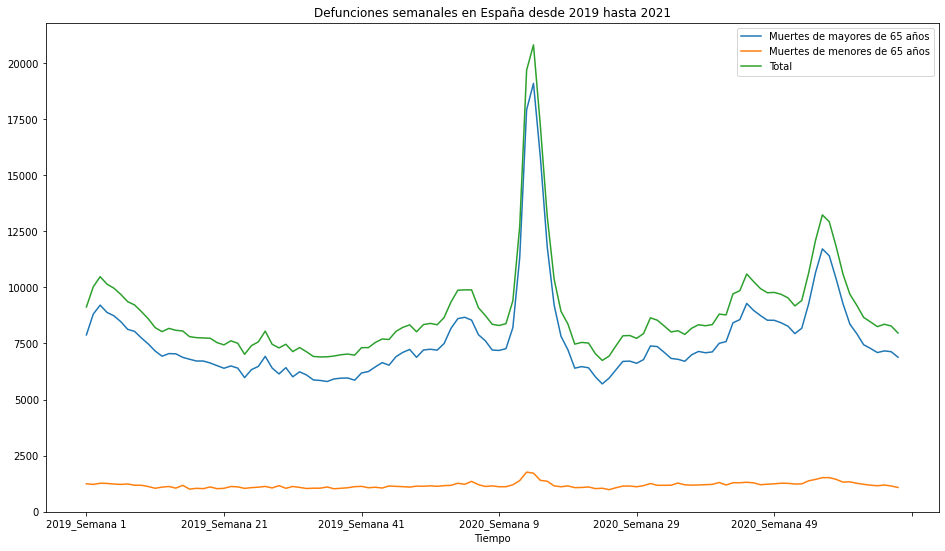

,Año,Periodo,Muertes de mayores de 65 años,Muertes de menores de 65 años,Tiempo,Total
0,2019,Semana 1,7880,1247,2019_Semana 1,9127
1,2019,Semana 2,8810,1215,2019_Semana 2,10025
2,2019,Semana 3,9208,1268,2019_Semana 3,10476
3,2019,Semana 4,8882,1259,2019_Semana 4,10141
4,2019,Semana 5,8732,1232,2019_Semana 5,9964
...,...,...,...,...,...,...
114,2021,Semana 10,7277,1181,2021_Semana 10,8458
115,2021,Semana 11,7093,1156,2021_Semana 11,8249
116,2021,Semana 12,7168,1188,2021_Semana 12,8356
117,2021,Semana 13,7132,1146,2021_Semana 13,8278


In [54]:
df_defunciones_spain_2019_2021_semanal = pd.read_csv(DATA_PATH_SPAIN_DEFUNCIONES_2019_2021, sep=";", thousands=".")

df_defunciones_spain_2019_2021_semanal["Tiempo"] = df_defunciones_spain_2019_2021_semanal["Año"].apply(str)  + "_" + df_defunciones_spain_2019_2021_semanal["Periodo"]
df_defunciones_spain_2019_2021_semanal["Total"] = df_defunciones_spain_2019_2021_semanal["Muertes de menores de 65 años"] + df_defunciones_spain_2019_2021_semanal["Muertes de mayores de 65 años"]

# Grafica de muertes donde se pueden apreciar las 2 olas del covid

df_defunciones_spain_2019_2021_semanal.plot(x="Tiempo", y=["Muertes de mayores de 65 años", "Muertes de menores de 65 años", "Total"], 
                                    figsize=(16,9), title="Defunciones semanales en España desde 2019 hasta 2021")
plt.show()

df_defunciones_spain_2019_2021_semanal

##### CCAA comparacion de defunciones 2019 vs 2020

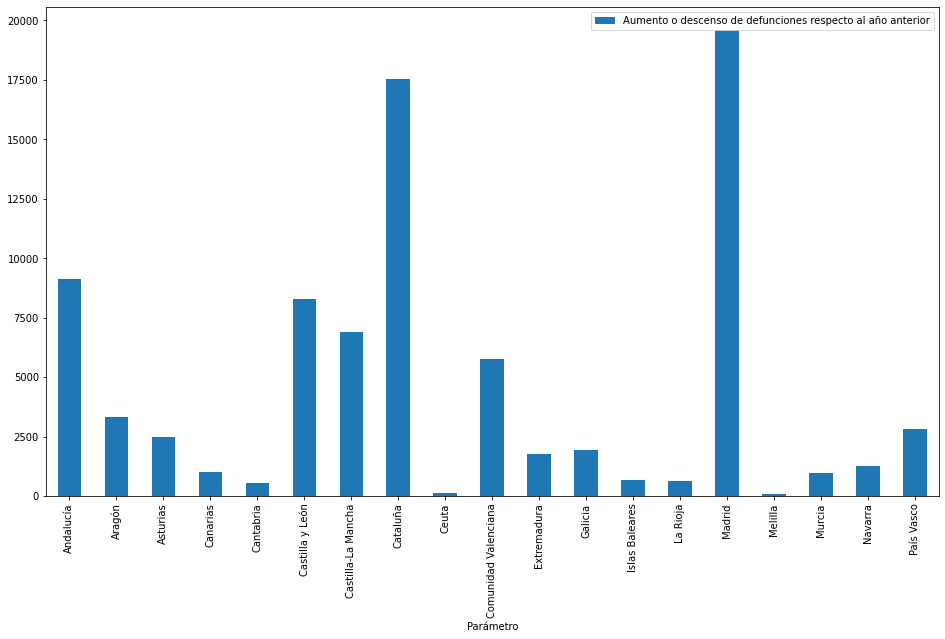

,Año,Periodo,Parámetro,Aumento o descenso de defunciones respecto al año anterior
0,2020,Año,Andalucía,9133
1,2020,Año,Aragón,3317
2,2020,Año,Asturias,2502
3,2020,Año,Canarias,1024
4,2020,Año,Cantabria,551
5,2020,Año,Castilla y León,8269
6,2020,Año,Castilla-La Mancha,6909
7,2020,Año,Cataluña,17516
8,2020,Año,Ceuta,114
9,2020,Año,Comunidad Valenciana,5762


In [29]:
df_defunciones_spain_2019vs2020 = pd.read_csv(DATA_PATH_SPAIN_DEFUNCIONES_2019vs2020, sep=";", thousands=".")

df_defunciones_spain_2019vs2020

 ## Grafica enseñando el aumento de defunciones en el 2020 comparado con el 2019
df_defunciones_spain_2019vs2020.plot(x="Parámetro", y="Aumento o descenso de defunciones respecto al año anterior", figsize=(16,9), kind="bar")
plt.show()

df_defunciones_spain_2019vs2020

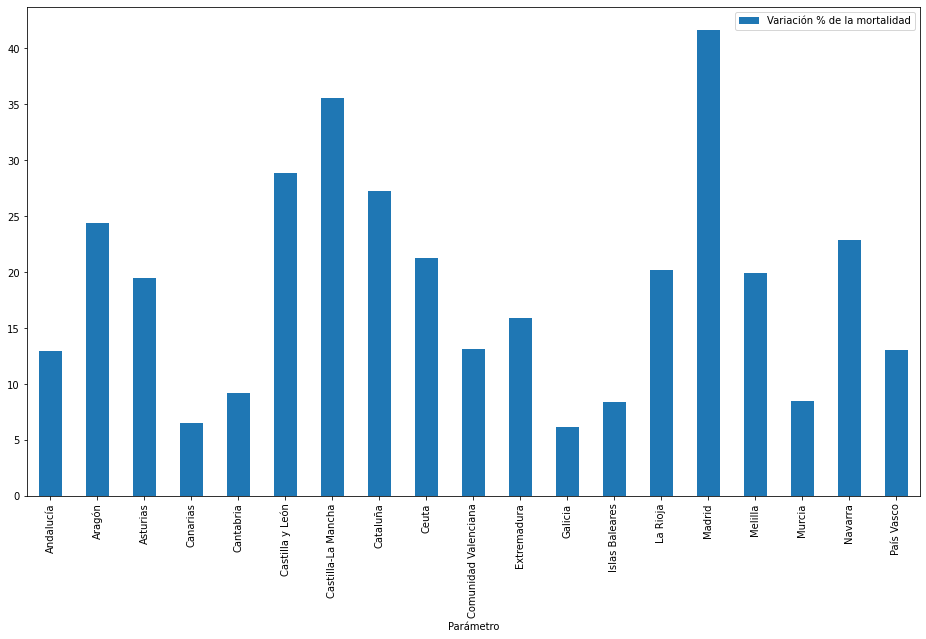

,Año,Periodo,Parámetro,Variación % de la mortalidad
0,2020,Año,Andalucía,13
1,2020,Año,Aragón,24
2,2020,Año,Asturias,19
3,2020,Año,Canarias,7
4,2020,Año,Cantabria,9
5,2020,Año,Castilla y León,29
6,2020,Año,Castilla-La Mancha,36
7,2020,Año,Cataluña,27
8,2020,Año,Ceuta,21
9,2020,Año,Comunidad Valenciana,13


In [30]:
df_tasa_spain_2019vs2020 = pd.read_csv(DATA_PATH_SPAIN_TASA_2019vs2020, sep=";", thousands=".", decimal=",", float_precision='high')

df_tasa_spain_2019vs2020
# # ## Graphic of deaths of covid in spain

df_tasa_spain_2019vs2020.plot(x="Parámetro", y="Variación % de la mortalidad", figsize=(16,9), kind="bar")
plt.show()

df_tasa_spain_2019vs2020

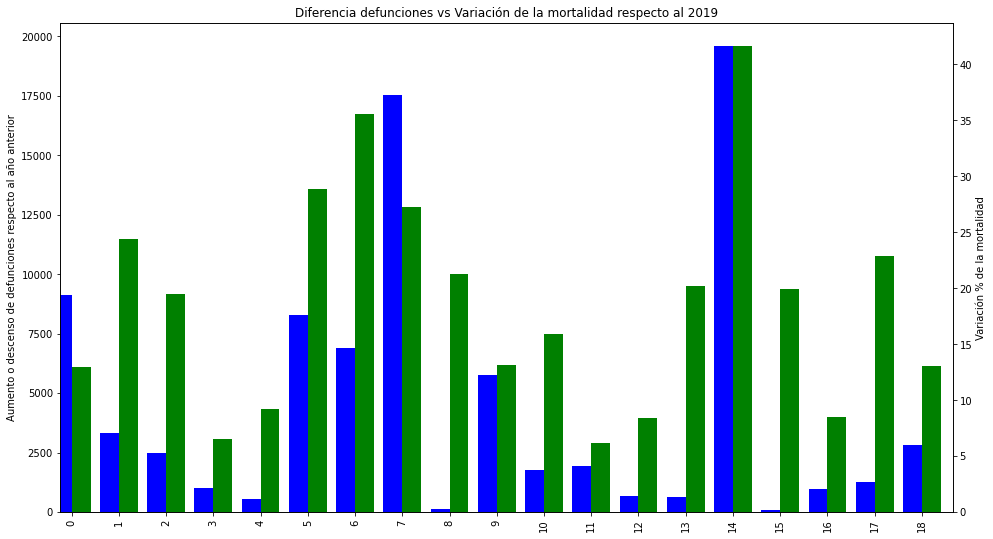

In [31]:
fig = plt.figure(figsize=(16, 9))
ax1 = fig.add_subplot(111)
ax2 = ax1.twinx()

ax1.set_ylabel('Aumento o descenso de defunciones respecto al año anterior')
ax2.set_ylabel('Variación % de la mortalidad')

width=0.4

# df_defunciones_spain_2019vs2020=df_defunciones_spain_2019vs2020.set_index('Parámetro').sort_index()
# df_tasa_spain_2019vs2020=df_tasa_spain_2019vs2020.set_index('Parámetro').sort_index()

df_defunciones_spain_2019vs2020['Aumento o descenso de defunciones respecto al año anterior'].plot(kind='bar',color='blue',ax=ax1,width=width,position=1)
df_tasa_spain_2019vs2020['Variación % de la mortalidad'].plot(kind='bar',color='green', ax=ax2, 
                                                              width=width, position=0, 
                                                              title="Diferencia defunciones vs Variación de la mortalidad respecto al 2019")

plt.show()

#### Tasa de mortalidad

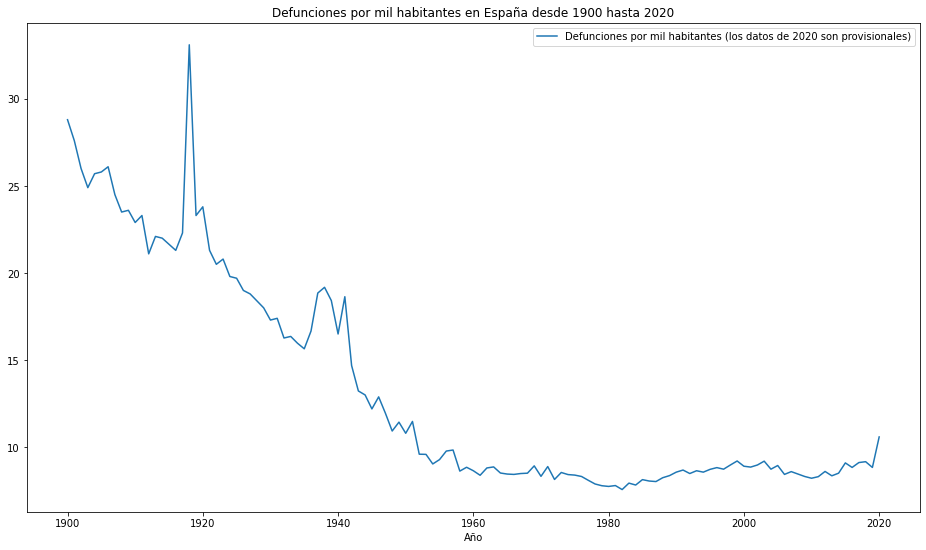

,Año,Periodo,Defunciones por mil habitantes (los datos de 2020 son provisionales)
0,1900,Año,29
1,1901,Año,28
2,1902,Año,26
3,1903,Año,25
4,1904,Año,26
...,...,...,...
115,2016,Año,9
116,2017,Año,9
117,2018,Año,9
118,2019,Año,9


In [120]:
df_tasa_spain_1900_2020 = pd.read_csv(DATA_PATH_SPAIN_TASA_1900_2020, sep=";", thousands=".", decimal=",")
# # ## Graphic of deaths of covid in spain
df_tasa_spain_1900_2020.plot(x="Año", y="Defunciones por mil habitantes (los datos de 2020 son provisionales)", figsize=(16,9),
                             title="Defunciones por mil habitantes en España desde 1900 hasta 2020")
plt.show()
df_tasa_spain_1900_2020

### Covid

##### Numero de casos covid españa por ccaa

In [78]:
df_ncasos_covid = pd.read_csv(DATA_PATH_SPAIN_CASOS_COVID)
df_ncasos_covid = df_ncasos_covid.rename(
    columns={"ccaa_iso": "ccaa"})
df_ncasos_covid = numerizacionDeAtributos(df_ncasos_covid, standardize["ccaa"], "ccaa", False)
df_ncasos_covid = dateFormatter(df_ncasos_covid, "fecha")

## Graphic of deaths of covid in spain
fig = px.line(df_ncasos_covid, x="fecha", y="num_casos", color="ccaa",
              line_group="ccaa")
fig.show()

## Show table
# df_ncasos_covid = df_ncasos_covid[["ccaa", "num_casos", "year", "month", "day"]]
df_ncasos_covid.tail(n=20)


,ccaa,fecha,num_casos,num_casos_prueba_pcr,num_casos_prueba_test_ac,num_casos_prueba_ag,num_casos_prueba_elisa,num_casos_prueba_desconocida,year,month,day
9461,10,2021-05-12,28,24,0,4,0,0,2021,5,12
9462,1,2021-05-13,0,0,0,0,0,0,2021,5,13
9463,2,2021-05-13,0,0,0,0,0,0,2021,5,13
9464,3,2021-05-13,0,0,0,0,0,0,2021,5,13
9465,6,2021-05-13,0,0,0,0,0,0,2021,5,13
9466,18,2021-05-13,0,0,0,0,0,0,2021,5,13
9467,7,2021-05-13,0,0,0,0,0,0,2021,5,13
9468,8,2021-05-13,0,0,0,0,0,0,2021,5,13
9469,5,2021-05-13,1,1,0,0,0,0,2021,5,13
9470,9,2021-05-13,1,1,0,0,0,0,2021,5,13


##### Numero de casos UCI covid españa por ccaa

In [88]:
## Información de UCI y hospitalizaciónn; Problema esta por provincias y dividido en edades con intervalos

df_uci_covid = pd.read_csv(DATA_PATH_SPAIN_UCI)
df_uci_covid = df_uci_covid.dropna()

## Graphic 
fig = px.line(df_uci_covid, x="fecha", y="num_casos", color="provincia_iso",
              line_group="provincia_iso")
fig.show()

## Show table
df_uci_covid.sample(n=20)


,provincia_iso,sexo,grupo_edad,fecha,num_casos,num_hosp,num_uci,num_def
279977,B,M,70-79,2020-06-25,2,0,0,0
530758,SO,NC,80+,2020-11-29,0,0,0,0
623787,GC,NC,70-79,2021-01-27,0,0,0,0
73168,A,NC,80+,2020-02-16,0,0,0,0
604826,H,NC,60-69,2021-01-15,0,0,0,0
497282,SE,H,20-29,2020-11-08,19,0,0,0
763119,VI,H,NC,2021-04-24,0,0,0,0
565184,LE,M,40-49,2020-12-21,3,0,0,0
568675,OR,NC,50-59,2020-12-23,0,0,0,0
151362,CC,M,20-29,2020-04-05,0,0,0,0


##### Vacunas españa


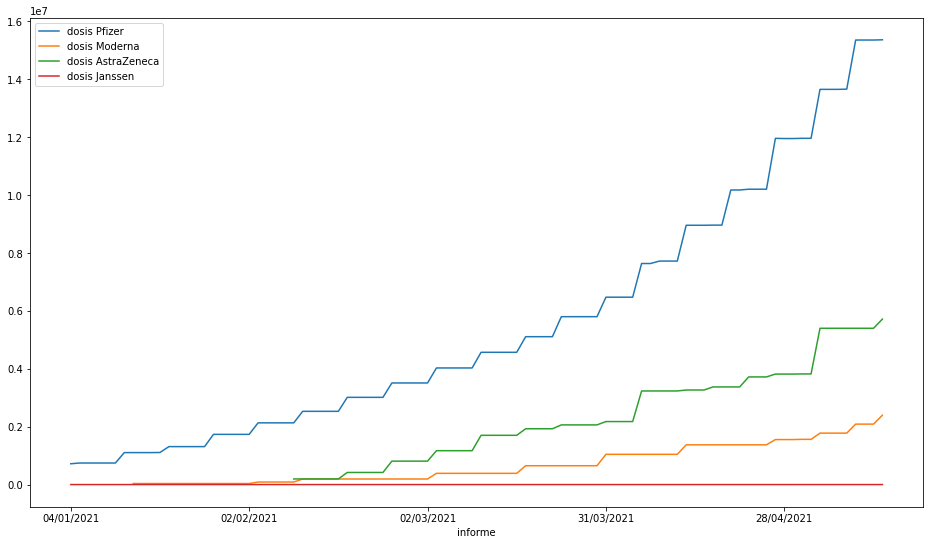

,informe,ccaa,dosis Pfizer,dosis Moderna,dosis AstraZeneca,dosis Janssen,dosis entregadas,dosis administradas,% sobre entregadas,personas con al menos una dosis,personas con pauta completa
859,04/03/2021,0,4026555,"387,600","1,169,800",0,5583955,4229092,75.7,NaN,1308913
879,05/03/2021,0,4026555,"387,600","1,169,800",0,5583955,4471577,80.1,NaN,1342485
899,08/03/2021,0,4026555,"387,600","1,169,800",0,5583955,4712191,84.4,NaN,1383488
919,09/03/2021,0,4026555,"387,600","1,169,800",0,5583955,4848648,86.8,NaN,1412236
939,10/03/2021,0,4567095,"387,600","1,700,500",0,6655195,4989505,75.0,NaN,1447838
959,11/03/2021,0,4567095,"387,600","1,700,500",0,6655195,5172106,77.7,NaN,1503258
979,12/03/2021,0,4567095,"387,600","1,700,500",0,6655195,5352767,80.4,NaN,1583244
999,15/03/2021,0,4567095,"387,600","1,700,500",0,6655195,5644895,84.8,NaN,1693674
1019,16/03/2021,0,4567095,"387,600","1,700,500",0,6655195,5742218,86.3,NaN,1728537
1039,17/03/2021,0,5106465,"650,400","1,927,400",0,7684265,5857085,76.2,NaN,1804615


In [74]:
df_vacunas_spain = pd.read_csv(DATA_PATH_SPAIN_VACUNAS, thousands=",", decimal="." ,converters={"% sobre entregadas": percentageToNumeric})
df_vacunas_spain = df_vacunas_spain.rename(
    columns={"comunidad autónoma": "ccaa"})

df_vacunas_spain =  numerizacionDeAtributos(df_vacunas_spain, standardize["ccaa"], "ccaa", True)
df_vacunas_spain = df_vacunas_spain.fillna(0)

## Convert string into numeric
df_vacunas_spain["dosis Pfizer"] = df_vacunas_spain["dosis Pfizer"].str.replace(".", "") 
df_vacunas_spain["dosis Moderna"] = df_vacunas_spain["dosis Moderna"].str.replace(".", "")
df_vacunas_spain["dosis Moderna"] = df_vacunas_spain["dosis Moderna"].str.replace(",", "") 
df_vacunas_spain["dosis AstraZeneca"] = df_vacunas_spain["dosis AstraZeneca"].str.replace(".", "")
df_vacunas_spain["dosis AstraZeneca"] = df_vacunas_spain["dosis AstraZeneca"].str.replace(",", "") 
df_vacunas_spain["dosis entregadas"] = df_vacunas_spain["dosis entregadas"].str.replace(".", "") 
df_vacunas_spain["dosis administradas"] = df_vacunas_spain["dosis administradas"].str.replace(".", "") 
df_vacunas_spain["personas con al menos una dosis"] = df_vacunas_spain["personas con al menos una dosis"].str.replace(".", "") 
df_vacunas_spain["personas con pauta completa"] = df_vacunas_spain["personas con pauta completa"].str.replace(".", "") 

df_vacunas_spain["dosis Pfizer"] = pd.to_numeric(df_vacunas_spain["dosis Pfizer"])
df_vacunas_spain["dosis Moderna"] = pd.to_numeric(df_vacunas_spain["dosis Moderna"])
df_vacunas_spain["dosis AstraZeneca"] = pd.to_numeric(df_vacunas_spain["dosis AstraZeneca"])

# Grafica de vacunas
df_vacunas_spain[df_vacunas_spain["ccaa"] == 0].plot(x="informe", y=["dosis Pfizer", "dosis Moderna", "dosis AstraZeneca", "dosis Janssen"], figsize=(16, 9), kind="line")
plt.show()

#show table

# df_vacunas_spain = dateFormatter(df_vacunas_spain, "informe")
df_vacunas_spain = df_vacunas_spain.drop(["última vacuna registrada"], axis=1)

df_vacunas_spain[df_vacunas_spain["ccaa"] == 0].tail(n=50)

### Datos extra España

#### Nacimientos

##### Nacimientos 1941-1974

In [108]:
df_births_spain_1941_1974 = pd.read_csv(DATA_PATH_SPAIN_NACIMIENTOS_1941_1974, sep=";", thousands=".", encoding='latin-1')
df_births_spain_1941_1974 = df_births_spain_1941_1974.rename(columns={"Comunidades y Ciudades Autónomas": "ccaa", "Periodo": "time", "Total": "births"})
df_births_spain_1941_1974["ccaa"] = df_births_spain_1941_1974["ccaa"].replace("Total", "0 Total")
df_births_spain_1941_1974["ccaa"] = df_births_spain_1941_1974["ccaa"].replace("Extranjero", "20 Extranjero")
df_births_spain_1941_1974 = extraerEnteros(df_births_spain_1941_1974, "ccaa") 
df_births_spain_1941_1974['ccaa'] = df_births_spain_1941_1974['ccaa'].fillna(0)
df_births_spain_1941_1974 = df_births_spain_1941_1974[["time", "ccaa", "births"]]
df_births_spain_1941_1974 = df_births_spain_1941_1974.sort_values(by="time")

# ## Graphic of births 
fig = px.line(df_births_spain_1941_1974, x="time", y="births", color="ccaa",
              line_group="ccaa", title="Nacimientos mensuales en España por región desde 1941 hasta 1974")
fig.show()

df_births_spain_1941_1974 = splitYearMonth(df_births_spain_1941_1974, "time")


df_births_spain_1941_1974


,time,ccaa,births,year,month
3671,1941M01,8,3849,1941,01
1223,1941M01,2,1667,1941,01
1631,1941M01,3,1125,1941,01
2039,1941M01,4,569,1941,01
2447,1941M01,5,1631,1941,01
...,...,...,...,...,...
5712,1974M12,14,1914,1974,12
4488,1974M12,11,1403,1974,12
4896,1974M12,12,4037,1974,12
1224,1974M12,3,1654,1974,12


##### Nacimientos 1975-2019

In [111]:
df_births_spain_1975_2019 = pd.read_csv(DATA_PATH_SPAIN_NACIMIENTOS_1975_2019, sep=";", thousands=".", encoding='latin-1')
df_births_spain_1975_2019 = df_births_spain_1975_2019.rename(columns={"Comunidades y Ciudades Autónomas": "ccaa", "Periodo": "time", "Total": "births"})
df_births_spain_1975_2019["ccaa"] = df_births_spain_1975_2019["ccaa"].replace("Total", "0 Total")
df_births_spain_1975_2019["ccaa"] = df_births_spain_1975_2019["ccaa"].replace("Extranjero", "20 Extranjero")
df_births_spain_1975_2019 = extraerEnteros(df_births_spain_1975_2019, "ccaa") 
df_births_spain_1975_2019['ccaa'] = df_births_spain_1975_2019['ccaa'].fillna(0)
df_births_spain_1975_2019 = df_births_spain_1975_2019[["time", "ccaa", "births"]]
df_births_spain_1975_2019 = df_births_spain_1975_2019.sort_values(by="time")

# ## Graphic of births 
fig = px.line(df_births_spain_1975_2019, x="time", y="births", color="ccaa",
              line_group="ccaa", title="Nacimientos mensuales en España por región desde 1941 hasta 1974")
fig.show()

df_births_spain_1975_2019 = splitYearMonth(df_births_spain_1975_2019, "time")


df_births_spain_1975_2019


,time,ccaa,births,year,month
11339,1975M01,20,77,1975,01
9719,1975M01,17,305,1975,01
8099,1975M01,14,1514,1975,01
3239,1975M01,5,2196,1975,01
4319,1975M01,7,2790,1975,01
...,...,...,...,...,...
2160,2019M12,4,850,2019,12
4860,2019M12,9,5004,2019,12
9180,2019M12,17,184,2019,12
1080,2019M12,2,768,2019,12


##### Nacimientos en españa 2020 (enero - junio)

In [110]:
df_births_spain_2020 = pd.read_csv(DATA_PATH_SPAIN_NACIMIENTOS, sep=";", thousands=".", encoding='latin-1')
df_births_spain_2020 = df_births_spain_2020.rename(columns={"Comunidad autónoma de residencia de la madre": "ccaa", "Sexo": "gender", "Mes": "month", "Total": "births"})
df_births_spain_2020 = numerizacionDeAtributos(df_births_spain_2020, standardize["gender"], "gender", True)
df_births_spain_2020 = numerizacionDeAtributos(df_births_spain_2020, standardize["month"], "month", True)
df_births_spain_2020 = numerizacionDeAtributos(df_births_spain_2020, standardize["ccaa"], "ccaa", True)
df_births_spain_2020['year'] = 2020


## Graphic of births 
df_births_spain_2020_graphic = df_births_spain_2020[(df_births_spain_2020["gender"] == 0) & (df_births_spain_2020["month"] > 0)]
fig = px.line(df_births_spain_2020_graphic, x="month", y="births", color="ccaa",
              line_group="ccaa")
fig.show()

#Show table
df_births_spain_2020[(df_births_spain_2020["ccaa"] == 0) & (df_births_spain_2020["gender"] == 0)].sample(n=6)



,ccaa,month,gender,births,year
6,0,2,0,26753,2020
12,0,4,0,26760,2020
9,0,3,0,28616,2020
15,0,5,0,27883,2020
18,0,6,0,27836,2020
0,0,0,0,168047,2020


##### Nacimientos en España

In [113]:
df_births_spain_total = pd.concat(
    [
     df_births_spain_1941_1974, 
     df_births_spain_1975_2019, 
     df_births_spain_2020
     ]) 

df_births_spain_total = df_births_spain_total.fillna(0)

## Sort and apply same format for all the rows
df_births_spain_total = df_births_spain_total.sort_values(by=["year", "month"])
df_births_spain_total["Periodo"] = df_births_spain_total["year"].apply(str) + "_" + df_births_spain_total["month"].apply(str)
df_births_spain_total = df_births_spain_total.sort_values(by="Periodo")

## Gráfico con todos los datos relacionados a defunciones en España
fig = px.line(df_births_spain_total[(df_births_spain_total["gender"] == 0) & (df_births_spain_total["month"] != 0)], 
              x="Periodo", y="births", color="ccaa",
              line_group="ccaa",
              title="Nacimientos en España Anual desde 1941 hasta 2020.<br>Desde 1941 hasta 2018 mensual (ccaa).<br>Desde 2019 a 2021 diario")
fig.show()

df_births_spain_total =  df_births_spain_total.drop("Periodo", axis=1)
df_births_spain_total =  df_births_spain_total.drop_duplicates()

df_births_spain_total[df_births_spain_total["year"] == 2020]



,time,ccaa,births,year,month,gender
232,0,11,1830,2020,0,2
233,0,11,1784,2020,0,1
252,0,12,7562,2020,0,0
253,0,12,3808,2020,0,2
254,0,12,3754,2020,0,1
...,...,...,...,...,...,...
207,0,9,4777,2020,6,0
208,0,9,2422,2020,6,2
209,0,9,2355,2020,6,1
229,0,10,1431,2020,6,2


#### Poblacion

##### Poblacion 1971-2020

In [115]:
df_population_spain = pd.read_csv(DATA_PATH_SPAIN_POBLACION, sep=";", decimal=".", thousands=".")
df_population_spain = df_population_spain.rename(columns={"Comunidades y Ciudades Autónomas": "ccaa", "Sexo": "gender", "Periodo": "year", "Total": "population"})
df_population_spain = numerizacionDeAtributos(df_population_spain, standardize["gender"], "gender", True)
df_population_spain = numerizacionDeAtributos(df_population_spain, standardize["ccaa"], "ccaa", True)
df_population_spain.apply(pd.to_numeric)

## Graph
fig = px.line(df_population_spain[df_population_spain["gender"] == 0], x="year", y="population", color="ccaa",
              line_group="ccaa")
fig.show()

## Table
df_population_spain.sample(n=50)



,ccaa,gender,year,population
338,4,2,2007,"517,593"
1308,17,2,2012,"161,574"
305,4,0,2015,"1,104,479"
76,1,0,2019,"8,414,240"
738,9,1,2007,"3,632,332"
815,10,1,2005,"2,360,166"
904,12,0,2016,"2,718,525"
813,10,1,2007,"2,452,867"
1022,13,2,1998,"2,444,919"
349,4,2,1996,"373,891"


#### Mortalidad 1998-2020 (Falta calcular bien la mortalidad)

In [ ]:
df_mortailidad = pd.merge(df_defunciones_spain_total, df_population_spain,  
                          on=['ccaa', 'year', 'gender'])

# df_mortailidad["mortalidad"] = df_mortailidad["deaths"] / df_mortailidad["population"] 
df_mortailidad['mortalidad'] =df_mortailidad.apply(lambda x: x['deaths'] / x['population'], axis=1)

df_mortailidad[(df_mortailidad["ccaa"] == 13) & (df_mortailidad["month"] == 2) ]


,year,deaths,ccaa,month,gender,population,mortalidad
757,2020,"3,896",13,2,0,"6,779,888",0
764,2020,"1,908",13,2,2,"3,243,793",0
771,2020,"1,988",13,2,1,"3,536,095",0


#### Turistas INE mensual


In [116]:
df_turistas = pd.read_csv(DATA_PATH_SPAIN_TURISTAS, sep=";", encoding='latin-1')
df_turistas = df_turistas.rename(
    columns={"Comunidad autónoma de destino": "ccaa", "Total": "n_viajeros"})
df_turistas = df_turistas[["ccaa", "Periodo", "n_viajeros"]]

df_turistas["n_viajeros"] = df_turistas["n_viajeros"].str.replace(".", "")
df_turistas['n_viajeros'] = df_turistas['n_viajeros'].str.extract('(\d+)', expand=False)
df_turistas['n_viajeros'] = df_turistas['n_viajeros'].astype(float)
df_turistas = df_turistas.sort_values("Periodo")

fig = px.line(df_turistas, x="Periodo", y="n_viajeros", color="ccaa",
              line_group="ccaa", title="Viajeros desde 2015 hasta el 2021")
fig.show()

df_turistas = extraerEnteros(df_turistas, "ccaa")
df_turistas = df_turistas.fillna(value={'ccaa': 0})
df_turistas = splitYearMonth(df_turistas, "Periodo")

df_turistas = df_turistas[["ccaa", "year", "month", "n_viajeros"]]
df_turistas



,ccaa,year,month,n_viajeros
593,8,2015,10,nan
197,2,2015,10,"49,599"
263,3,2015,10,"17,410"
329,4,2015,10,"991,830"
395,5,2015,10,"1,094,268"
...,...,...,...,...
1056,16,2021,03,"16,825"
330,5,2021,03,"100,524"
924,14,2021,03,"2,511"
528,8,2021,03,nan


#### Tabla de españa


In [117]:
# [ccaa	anio	mes	dia	sexo	edad	cod_ambito	defunciones_teoricas	defunciones	mortalidad	nacimientos	poblacion	defunciones_covid	covid19	lugar_de_ocurrencia	semana	n_casos	causa_muerte	n_turistas]
df_spain = pd.concat(
    [df_defunciones_spain_total,
     df_ncasos_covid,
     df_turistas,
     df_vacunas_spain,
     df_population_spain
     ], axis=0) 
df_spain = df_spain.apply(pd.to_numeric) # convert all columns of DataFrame

df_spain.sample(n=50)


ValueError: ignored

In [ ]:
df_spain.fillna(0)
df_spain_ccaa = df_spain[(df_spain["ccaa"] != 0) & df_spain["gender"] != 0]
df_spain_ccaa = df_spain_ccaa.fillna(0)

df_spain_ccaa = df_spain_ccaa.groupby(['ccaa','gender','year', 'month'], as_index=False).sum()

df_spain_ccaa[df_spain_ccaa["year"] == 2020].head(50)

,ccaa,gender,year,month,deaths,num_casos,day,n_viajeros,dosis Pfizer,dosis Moderna,dosis AstraZeneca,dosis Janssen,dosis entregadas,dosis administradas,% sobre entregadas,personas con al menos una dosis,personas con pauta completa,population
24,1,1,2020,0,"18,788",0,0,0,0,0,0,0,0,0,0,0,0,"4,293,806"
25,1,1,2020,1,"3,700",0,0,0,0,0,0,0,0,0,0,0,0,0
26,1,1,2020,2,"3,121",0,0,0,0,0,0,0,0,0,0,0,0,0
27,1,1,2020,3,"3,440",0,0,0,0,0,0,0,0,0,0,0,0,0
28,1,1,2020,4,"3,322",0,0,0,0,0,0,0,0,0,0,0,0,0
29,1,1,2020,5,"2,747",0,0,0,0,0,0,0,0,0,0,0,0,0
30,1,1,2020,6,"2,458",0,0,0,0,0,0,0,0,0,0,0,0,0
55,1,2,2020,0,"19,440",0,0,0,0,0,0,0,0,0,0,0,0,"4,170,605"
56,1,2,2020,1,"3,902",0,0,0,0,0,0,0,0,0,0,0,0,0
57,1,2,2020,2,"3,173",0,0,0,0,0,0,0,0,0,0,0,0,0


# Europa


#### Owid full dataset

In [ ]:
df_owid_online = pd.read_csv(URL_OWID_COVID)
df_owid_online = df_owid_online[df_owid_online["continent"] == "Europe"]

fig = px.line(df_owid_online, x="date", y="total_cases_per_million", color="iso_code",
              line_group="iso_code")
fig.show()

fig = px.line(df_owid_online, x="date", y="total_tests_per_thousand", color="iso_code",
              line_group="iso_code")
fig.show()

df_owid_online[df_owid_online["location"] == "Spain"]



,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
73878,ESP,Europe,Spain,2020-02-01,1,1,nan,nan,nan,nan,0,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,11,"46,754,783",93,46,19,14,"34,272",1,99,7,27,31,nan,3,84,1
73879,ESP,Europe,Spain,2020-02-02,1,0,nan,nan,nan,nan,0,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,3,0,18,0,nan,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,11,"46,754,783",93,46,19,14,"34,272",1,99,7,27,31,nan,3,84,1
73880,ESP,Europe,Spain,2020-02-03,1,0,nan,nan,nan,nan,0,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,11,"46,754,783",93,46,19,14,"34,272",1,99,7,27,31,nan,3,84,1
73881,ESP,Europe,Spain,2020-02-04,1,0,nan,nan,nan,nan,0,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,11,"46,754,783",93,46,19,14,"34,272",1,99,7,27,31,nan,3,84,1
73882,ESP,Europe,Spain,2020-02-05,1,0,nan,nan,nan,nan,0,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,11,"46,754,783",93,46,19,14,"34,272",1,99,7,27,31,nan,3,84,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74338,ESP,Europe,Spain,2021-05-06,"3,559,222","7,960","6,326","78,726",160,92,"76,125",170,135,"1,684",3,2,1,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,"19,048,132","13,271,511","5,956,451","558,552","383,362",41,28,13,"8,199",68,"46,754,783",93,46,19,14,"34,272",1,99,7,27,31,nan,3,84,1
74339,ESP,Europe,Spain,2021-05-07,"3,567,408","8,186","6,190","78,792",66,82,"76,300",175,132,"1,685",1,2,1,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,nan,nan,"381,863",nan,nan,nan,"8,167",68,"46,754,783",93,46,19,14,"34,272",1,99,7,27,31,nan,3,84,1
74340,ESP,Europe,Spain,2021-05-08,"3,567,408",0,"6,190","78,792",0,82,"76,300",0,132,"1,685",0,2,1,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,nan,nan,"380,364",nan,nan,nan,"8,135",68,"46,754,783",93,46,19,14,"34,272",1,99,7,27,31,nan,3,84,1
74341,ESP,Europe,Spain,2021-05-09,"3,567,408",0,"6,190","78,792",0,82,"76,300",0,132,"1,685",0,2,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,"19,830,624","13,797,431","6,221,476",nan,"378,865",42,30,13,"8,103",63,"46,754,783",93,46,19,14,"34,272",1,99,7,27,31,nan,3,84,1


 #### Vacunas en el mundo (No lo uso)

In [ ]:
df_vaccinations_online = pd.read_csv(URL_OWID_VACCINATIONS)

## Graphic of deaths of covid in spain 
fig = px.line(df_vaccinations_online, x="date", y="total_vaccinations", color="iso_code",
              line_group="iso_code")
fig.show()

df_vaccinations_online.sort_values('date')

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million
16943,World,OWID_WRL,2020-12-14,5,0,nan,nan,nan,0,0,nan,nan
2714,Canada,CAN,2020-12-14,5,nan,nan,nan,nan,0,nan,nan,nan
11145,North America,OWID_NAM,2020-12-14,5,0,nan,nan,nan,0,0,nan,nan
16944,World,OWID_WRL,2020-12-15,"1,529,223","28,500",nan,"1,529,218","1,529,218",0,0,nan,196
11146,North America,OWID_NAM,2020-12-15,723,0,nan,718,718,0,0,nan,1
...,...,...,...,...,...,...,...,...,...,...,...,...
15796,Trinidad and Tobago,TTO,2021-05-10,"61,345","60,245","1,100",225,"2,362",4,4,0,"1,688"
5225,European Union,OWID_EUN,2021-05-10,"174,797,309","126,088,333","49,184,283","767,233","2,924,703",39,28,11,"6,574"
14688,South Africa,ZAF,2021-05-10,"395,230","395,230","395,230",nan,"9,447",1,1,1,159
9480,Macao,MAC,2021-05-10,"120,294","78,460","41,989","1,607","1,731",19,12,6,"2,666"


#### Casos y muertes Europa (No lo uso)

In [ ]:
df_covid_ecdc = pd.read_csv(URL_ECDC_COVID)
df_covid_ecdc.sort_values('dateRep')

,dateRep,day,month,year,cases,deaths,countriesAndTerritories,geoId,countryterritoryCode,popData2020,continentExp
1079,01/03/2021,1,3,2021,219592,4319,Ireland,IE,IRL,4964440,Europe
215,01/03/2021,1,3,2021,247038,10191,Bulgaria,BG,BGR,6951482,Europe
287,01/03/2021,1,3,2021,242973,5526,Croatia,HR,HRV,4058165,Europe
359,01/03/2021,1,3,2021,34707,231,Cyprus,CY,CYP,888005,Europe
431,01/03/2021,1,3,2021,1240051,20469,Czechia,CZ,CZE,10693939,Europe
...,...,...,...,...,...,...,...,...,...,...,...
905,31/03/2021,31,3,2021,0,0,Hungary,HU,HUN,9769526,Europe
1121,31/03/2021,31,3,2021,16055,529,Italy,IT,ITA,59641488,Europe
689,31/03/2021,31,3,2021,30702,381,France,FR,FRA,67320216,Europe
1553,31/03/2021,31,3,2021,5820,34,Netherlands,NL,NLD,17407585,Europe


In [ ]:
df_covid_ecdc_cases = pd.read_csv(URL_ECDC_COVID_CASES)
df_covid_online_sample = df_covid_ecdc_cases.sample(n=10)
df_covid_online_sample

,dateRep,day,month,year,cases,deaths,countriesAndTerritories,geoId,countryterritoryCode,popData2019,continentExp,Cumulative_number_for_14_days_of_COVID-19_cases_per_100000
60693,08/05/2020,8,5,2020,17,0,Vietnam,VN,VNM,"96,462,108",Asia,0
21205,08/05/2020,8,5,2020,65,0,Gabon,GA,GAB,"2,172,578",Africa,16
14973,23/11/2020,23,11,2020,1513,101,Czechia,CZ,CZE,"10,649,800",Europe,727
6365,27/03/2020,27,3,2020,1,0,Benin,BJ,BEN,"11,801,151",Africa,nan
43457,21/07/2020,21,7,2020,1013,40,Pakistan,PK,PAK,"216,565,317",Asia,15
38183,13/04/2020,13,4,2020,0,0,Mongolia,MN,MNG,"3,225,166",Asia,0
6190,18/09/2020,18,9,2020,0,0,Benin,BJ,BEN,"11,801,151",Africa,1
6032,02/06/2020,2,6,2020,0,0,Belize,BZ,BLZ,"390,351",America,0
12942,13/05/2020,13,5,2020,0,0,Comoros,KM,COM,"850,891",Africa,nan
25203,09/06/2020,9,6,2020,0,0,Guyana,GY,GUY,"782,775",America,2


#### Tipo de respuesta en cada pais de europa

In [ ]:
df_covid_ecdc_response = pd.read_csv(URL_ECDC_COVID_RESPONSE)
df_covid_ecdc_response.sort_values('date_start')

,Country,Response_measure,date_start,date_end
630,Greece,StayHomeGen,2020-02-27,2020-03-22
186,Croatia,MasksMandatoryAllSpacesPartial,2020-02-28,2020-10-27
936,Liechtenstein,OutdoorOver1000,2020-02-28,2020-03-12
932,Liechtenstein,MassGatherAll,2020-02-28,2020-09-30
1546,Switzerland,MassGatherAll,2020-02-28,2020-10-01
...,...,...,...,...
647,Hungary,ClosPubAnyPartial,2021-04-07,NaN
275,Czechia,ClosPrimPartial,2021-04-12,NaN
595,Greece,ClosSecPartial,2021-04-12,NaN
354,Denmark,ClosPubAnyPartial,2021-04-13,NaN


#### Turismo en el mundo (1995-2016)

In [ ]:
df_n_turism = pd.read_csv(DATA_PATH_EUR_NUM_TURISM)
df_n_turismsadas

,Entity,Code,Year,"International tourism, number of arrivals"
0,Albania,ALB,1995,"304,000"
1,Albania,ALB,1996,"287,000"
2,Albania,ALB,1997,"119,000"
3,Albania,ALB,1998,"184,000"
4,Albania,ALB,1999,"371,000"
...,...,...,...,...
5204,Zimbabwe,ZWE,2012,"1,794,000"
5205,Zimbabwe,ZWE,2013,"1,833,000"
5206,Zimbabwe,ZWE,2014,"1,880,000"
5207,Zimbabwe,ZWE,2015,"2,057,000"


In [ ]:
## Por regiones (Africa, europa....)
df_arrivals_turism = pd.read_csv(DATA_PATH_EUR_ARRIVALS_TURISM)
df_arrivals_turism

,Entity,Code,Year,International Tourist Arrivals
0,Africa,nan,1950,500000
1,Africa,nan,1960,800000
2,Africa,nan,1965,1400000
3,Africa,nan,1970,2400000
4,Africa,nan,1975,4700000
...,...,...,...,...
200,Middle East,nan,2014,55400000
201,Middle East,nan,2015,55900000
202,Middle East,nan,2016,53600000
203,Middle East,nan,2017,58000000
